**FINAL PROJECT: TIME SERIES FORECASTING**

**JAYASHREE JOHNSON**  
**CS675 INTRODUCTION TO DATA SCIENCE**

**INSTALL & IMPORT REQUIRED LIBRARIES**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
import warnings
warnings.filterwarnings('ignore')

**LOAD & INSPECT DATA**

In [3]:
file_path = 'Electric_Consumption_And_Cost__2010_-_Feb_2025__20250501.csv'
df = pd.read_csv('/content/Electric_Consumption_And_Cost__2010_-_Feb_2025__20250501.csv')
df.head()

,Development Name,Borough,Account Name,Location,Meter AMR,Meter Scope,TDS #,EDP,RC Code,Funding Source,...,Meter Number,Estimated,Current Charges,Rate Class,Bill Analyzed,Consumption (KWH),KWH Charges,Consumption (KW),KW Charges,Other charges
0,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,15396.82,GOV/NYC/068,Yes,128800.0,7387.97,216.0,2808.0,5200.85
1,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,14556.34,GOV/NYC/068,Yes,115200.0,6607.87,224.0,2912.0,5036.47
2,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,13904.98,GOV/NYC/068,Yes,103200.0,5919.55,216.0,2808.0,5177.43
3,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,14764.04,GOV/NYC/068,Yes,105600.0,6057.22,208.0,2704.0,6002.82
4,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,13729.54,GOV/NYC/068,Yes,97600.0,5598.34,216.0,2808.0,5323.20


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 521035 entries, 0 to 521034
Data columns (total 27 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Development Name    520414 non-null  object 
 1   Borough             521035 non-null  object 
 2   Account Name        521035 non-null  object 
 3   Location            507102 non-null  object 
 4   Meter AMR           520266 non-null  object 
 5   Meter Scope         27636 non-null   object 
 6   TDS #               519157 non-null  float64
 7   EDP                 521035 non-null  int64  
 8   RC Code             521035 non-null  object 
 9   Funding Source      521035 non-null  object 
 10  AMP #               518672 non-null  object 
 11  Vendor Name         521035 non-null  object 
 12  UMIS BILL ID        521035 non-null  int64  
 13  Revenue Month       521035 non-null  object 
 14  Service Start Date  521027 non-null  object 
 15  Service End Date    521027 non-nul

In [5]:
df.describe()

,TDS #,EDP,UMIS BILL ID,# days,Current Charges,Consumption (KWH),KWH Charges,Consumption (KW),KW Charges,Other charges
count,519157.000000,521035.000000,5.210350e+05,521027.000000,521035.000000,5.210350e+05,521035.000000,521035.000000,521035.000000,521035.000000
mean,116.499202,424.929924,7.480257e+06,30.361547,4284.955086,3.046078e+04,1433.879714,61.430595,858.910986,1992.164385
std,128.773830,186.993741,4.033719e+06,2.596024,6210.140634,4.850114e+04,2463.710587,530.949951,1494.695516,3835.804306
min,0.000000,63.000000,1.726303e+06,-335.000000,-25622.210000,0.000000e+00,0.000000,0.000000,0.000000,-59396.430000
25%,33.000000,225.000000,3.788160e+06,29.000000,649.990000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
50%,63.000000,426.000000,6.542550e+06,30.000000,2260.500000,1.192600e+04,527.790000,21.020000,249.400000,951.200000
75%,145.000000,552.000000,1.095094e+07,31.000000,5601.970000,4.520000e+04,2051.190000,88.000000,1259.500000,2838.560000
max,582.000000,999.000000,1.488953e+07,749.000000,424298.640000,2.788773e+06,195575.860000,329074.000000,78782.960000,312524.970000


In [6]:
print(df.columns)

Index(['Development Name', 'Borough', 'Account Name', 'Location', 'Meter AMR',
       'Meter Scope', 'TDS #', 'EDP', 'RC Code', 'Funding Source', 'AMP #',
       'Vendor Name', 'UMIS BILL ID', 'Revenue Month', 'Service Start Date',
       'Service End Date', '# days', 'Meter Number', 'Estimated',
       'Current Charges', 'Rate Class', 'Bill Analyzed', 'Consumption (KWH)',
       'KWH Charges', 'Consumption (KW)', 'KW Charges', 'Other charges'],
      dtype='object')


In [7]:
df.shape

(521035, 27)

In [8]:
df_full_clean = df.copy()

df_full_clean = df_full_clean.dropna(subset=[
    'Service End Date',
    'Consumption (KWH)',
    'Current Charges',
    'Development Name',
    'Borough',
    'Rate Class'
])

df_full_clean = df_full_clean[df_full_clean['Consumption (KWH)'] > 0]
df_full_clean = df_full_clean[df_full_clean['Current Charges'] > 0]

df_full_clean['Service End Date'] = pd.to_datetime(df_full_clean['Service End Date'])

In [9]:
fig = px.box(
    df_full_clean,
    x='Borough',
    y='Current Charges',
    title='Current Charges Distribution by Borough'
)

fig.show()

**DATA CLEANING**

In [10]:
df.isnull().sum()

,0
Development Name,621
Borough,0
Account Name,0
Location,13933
Meter AMR,769
Meter Scope,493399
TDS #,1878
EDP,0
RC Code,0
Funding Source,0


In [11]:
df_clean = df[['Service End Date', 'Consumption (KWH)']].copy()

df_clean.dropna(subset=['Service End Date', 'Consumption (KWH)'], inplace=True)

df_clean = df_clean[df_clean['Consumption (KWH)'] > 0]

df_clean.reset_index(drop=True, inplace=True)

print(f"Number of records after cleaning: {len(df_clean)}")
print("\nSample of cleaned data:")
print(df_clean.head())


Number of records after cleaning: 342180

Sample of cleaned data:
  Service End Date  Consumption (KWH)
0       01/26/2010           128800.0
1       02/25/2010           115200.0
2       03/26/2010           103200.0
3       04/26/2010           105600.0
4       05/24/2010            97600.0


In [12]:
df_clean.isnull().sum()

,0
Service End Date,0
Consumption (KWH),0


**OUTLIER DETECTION**

**IQR**

In [13]:
q1 = df_clean['Consumption (KWH)'].quantile(0.25)
q3 = df_clean['Consumption (KWH)'].quantile(0.75)
iqr = q3 - q1

lower_limit = q1 - 1.5 * iqr
upper_limit = q3 + 1.5 * iqr

print(f"Lower bound: {lower_limit}")
print(f"Upper bound: {upper_limit}")

df_no_outliers = df_clean[
    (df_clean['Consumption (KWH)'] >= lower_limit) &
    (df_clean['Consumption (KWH)'] <= upper_limit)
].reset_index(drop=True)

print(f"\nNumber of records after IQR outlier removal: {len(df_no_outliers)}")
print("\nSample data:")
print(df_no_outliers.head())


Lower bound: -57910.375
Upper bound: 132570.625

Number of records after IQR outlier removal: 326030

Sample data:
  Service End Date  Consumption (KWH)
0       01/26/2010           128800.0
1       02/25/2010           115200.0
2       03/26/2010           103200.0
3       04/26/2010           105600.0
4       05/24/2010            97600.0


**TIME SERIES: DAILY DATASET**

**Grouped by Service End Date**

In [14]:
df_no_outliers['Service End Date'] = pd.to_datetime(df_no_outliers['Service End Date'])

daily_data = df_no_outliers.groupby('Service End Date').agg({'Consumption (KWH)': 'sum'}).reset_index()

daily_data.rename(columns={'Service End Date': 'ds', 'Consumption (KWH)': 'y'}, inplace=True)

print(f"Number of unique days: {daily_data['ds'].nunique()}")
print("\nSample of final daily dataset:")
print(daily_data.head())


Number of unique days: 892

Sample of final daily dataset:
          ds           y
0 2010-01-20        33.0
1 2010-01-26  81521416.0
2 2010-01-28     18720.0
3 2010-01-29        93.0
4 2010-02-19        29.0


In [15]:
daily_data_iqr = df_no_outliers.groupby('Service End Date').agg({'Consumption (KWH)': 'sum'}).reset_index()
daily_data_iqr.rename(columns={'Service End Date': 'ds', 'Consumption (KWH)': 'y'}, inplace=True)

daily_data_iqr['ds'] = pd.to_datetime(daily_data_iqr['ds'])

daily_data_full = daily_data_iqr.set_index('ds').asfreq('D')
daily_data_full = daily_data_full.interpolate()
daily_data_full.reset_index(inplace=True)

**TIME UNIT DETECTION**


In [16]:
def detect_time_unit(df):
    df_sorted = df.sort_values(by='ds')
    freq = pd.infer_freq(df_sorted['ds'])
    if freq is not None:
        if 'D' in freq:
            return 'daily'
        elif 'M' in freq:
            return 'monthly'
        elif 'Y' in freq or 'A' in freq:
            return 'yearly'
    else:
        deltas = df_sorted['ds'].diff().dropna()
        mode_delta = deltas.mode()[0]
        if mode_delta.days >= 365:
            return 'yearly'
        elif mode_delta.days >= 28:
            return 'monthly'
        else:
            return 'daily'

time_unit = detect_time_unit(daily_data_full)
print(time_unit)

daily


**PROPHET MODELING FORECASTING: DEFAULT MODEL FOR DAILY DATA**

In [17]:
model_default = Prophet()

model_default.fit(daily_data_full)

future_default = model_default.make_future_dataframe(periods=365)

forecast_default = model_default.predict(future_default)

forecast_default[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/l85xdhky.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/na0o7pz1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42341', 'data', 'file=/tmp/tmpm_jcj0g8/l85xdhky.json', 'init=/tmp/tmpm_jcj0g8/na0o7pz1.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modeljgs_xwqd/prophet_model-20250506193227.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
5814,2025-12-21,-2.000458e+06,-2.909421e+07,2.677204e+07
5815,2025-12-22,-1.157561e+06,-2.934750e+07,2.817084e+07
5816,2025-12-23,-1.057124e+06,-2.842595e+07,2.939946e+07
5817,2025-12-24,-2.290018e+06,-2.908798e+07,2.299237e+07
5818,2025-12-25,-1.498102e+06,-3.011156e+07,2.830066e+07
5819,2025-12-26,-1.685852e+06,-3.114648e+07,2.656708e+07
5820,2025-12-27,-2.159533e+06,-2.962517e+07,2.683429e+07
5821,2025-12-28,-2.023160e+06,-2.935630e+07,2.533986e+07
5822,2025-12-29,-1.252334e+06,-2.798112e+07,2.540860e+07
5823,2025-12-30,-1.209399e+06,-2.855236e+07,2.742257e+07


In [32]:
fig_default = go.Figure()

fig_default.add_trace(go.Scatter(
    x=daily_data_full['ds'], y=daily_data_full['y'],
    mode='lines', name='Actual', line=dict(color='black')
))

fig_default.add_trace(go.Scatter(
    x=forecast_default['ds'], y=forecast_default['yhat'],
    mode='lines', name='Default Forecast', line=dict(color='pink')
))

fig_default.update_layout(
    title='Electricity Consumption Forecast - Default Model',
    xaxis_title='Date',
    yaxis_title='Consumption (KWH)'
)

fig_default.show()

**LINEAR GROWTH TUNED MODEL**

In [19]:
model_linear = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_linear.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_linear.fit(daily_data_full)

future_linear = model_linear.make_future_dataframe(periods=365)

forecast_linear = model_linear.predict(future_linear)

forecast_linear[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/kpol7ww_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/8tbxqm96.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50927', 'data', 'file=/tmp/tmpm_jcj0g8/kpol7ww_.json', 'init=/tmp/tmpm_jcj0g8/8tbxqm96.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelsgxr3lon/prophet_model-20250506193234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
5814,2025-12-21,-2.042581e+06,-2.860554e+07,2.392056e+07
5815,2025-12-22,-5.372291e+04,-2.545312e+07,2.487902e+07
5816,2025-12-23,1.855079e+06,-2.543791e+07,2.778018e+07
5817,2025-12-24,3.114155e+06,-2.302873e+07,2.893010e+07
5818,2025-12-25,6.419418e+06,-1.894828e+07,3.257684e+07
5819,2025-12-26,7.783930e+06,-1.585482e+07,3.368272e+07
5820,2025-12-27,7.494720e+06,-1.899832e+07,3.216959e+07
5821,2025-12-28,6.949747e+06,-2.100231e+07,3.427431e+07
5822,2025-12-29,7.101486e+06,-2.093380e+07,3.364649e+07
5823,2025-12-30,7.045239e+06,-1.957025e+07,3.174850e+07


In [20]:
fig_linear = go.Figure()

fig_linear.add_trace(go.Scatter(
    x=daily_data_full['ds'], y=daily_data_full['y'],
    mode='lines', name='Actual', line=dict(color='black')
))

fig_linear.add_trace(go.Scatter(
    x=forecast_linear['ds'], y=forecast_linear['yhat'],
    mode='lines', name='Linear Forecast', line=dict(color='blue')
))

fig_linear.update_layout(
    title='Electricity Consumption Forecast - Linear Growth',
    xaxis_title='Date',
    yaxis_title='Consumption (KWH)'
)

fig_linear.show()

**LOGISTIC GROWTH TUNED MODEL**

In [21]:
df_logistic = daily_data_full.copy()
df_logistic['cap'] = df_logistic['y'].max() * 1.2

model_logistic = Prophet(
    growth='logistic',
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_logistic.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_logistic.fit(df_logistic)

future_logistic = model_logistic.make_future_dataframe(periods=365)
future_logistic['cap'] = df_logistic['cap'].iloc[0]

forecast_logistic = model_logistic.predict(future_logistic)

forecast_logistic[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/pn11oba3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/zcz5i1x4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21507', 'data', 'file=/tmp/tmpm_jcj0g8/pn11oba3.json', 'init=/tmp/tmpm_jcj0g8/zcz5i1x4.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelzpqv7z3_/prophet_model-20250506193244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:32:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:32:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
5814,2025-12-21,7.444293e+05,-2.510097e+07,2.564676e+07
5815,2025-12-22,2.740743e+06,-2.477425e+07,2.876372e+07
5816,2025-12-23,4.660075e+06,-2.050079e+07,3.141139e+07
5817,2025-12-24,5.926831e+06,-2.127718e+07,3.000456e+07
5818,2025-12-25,9.241795e+06,-2.014902e+07,3.246177e+07
5819,2025-12-26,1.061628e+07,-1.503902e+07,3.667458e+07
5820,2025-12-27,1.033709e+07,-1.603613e+07,3.501579e+07
5821,2025-12-28,9.802443e+06,-1.743100e+07,3.573800e+07
5822,2025-12-29,9.965240e+06,-1.610824e+07,3.713608e+07
5823,2025-12-30,9.923169e+06,-1.569444e+07,3.677032e+07


In [22]:
fig_logistic = go.Figure()

fig_logistic.add_trace(go.Scatter(
    x=daily_data_full['ds'], y=daily_data_full['y'],
    mode='lines', name='Actual', line=dict(color='black')
))

fig_logistic.add_trace(go.Scatter(
    x=forecast_logistic['ds'], y=forecast_logistic['yhat'],
    mode='lines', name='Logistic Forecast', line=dict(color='red')
))

fig_logistic.update_layout(
    title='Electricity Consumption Forecast - Logistic Growth',
    xaxis_title='Date',
    yaxis_title='Consumption (KWH)'
)

fig_logistic.show()

**FLAT GROWTH TUNED MODEL**

In [23]:
df_flat = daily_data_full.copy()
df_flat['y'] = df_flat['y'].mean()

model_flat = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_flat.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_flat.fit(df_flat)

future_flat = model_flat.make_future_dataframe(periods=365)

forecast_flat = model_flat.predict(future_flat)

forecast_flat[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
5814,2025-12-21,1.144845e+07,1.144845e+07,1.144845e+07
5815,2025-12-22,1.144845e+07,1.144845e+07,1.144845e+07
5816,2025-12-23,1.144845e+07,1.144845e+07,1.144845e+07
5817,2025-12-24,1.144845e+07,1.144845e+07,1.144845e+07
5818,2025-12-25,1.144845e+07,1.144845e+07,1.144845e+07
5819,2025-12-26,1.144845e+07,1.144845e+07,1.144845e+07
5820,2025-12-27,1.144845e+07,1.144845e+07,1.144845e+07
5821,2025-12-28,1.144845e+07,1.144845e+07,1.144845e+07
5822,2025-12-29,1.144845e+07,1.144845e+07,1.144845e+07
5823,2025-12-30,1.144845e+07,1.144845e+07,1.144845e+07


In [24]:
fig_flat = go.Figure()

fig_flat.add_trace(go.Scatter(
    x=daily_data_full['ds'], y=daily_data_full['y'],
    mode='lines', name='Actual', line=dict(color='black')
))

fig_flat.add_trace(go.Scatter(
    x=forecast_flat['ds'], y=forecast_flat['yhat'],
    mode='lines', name='Flat Forecast', line=dict(color='yellow')
))

fig_flat.update_layout(
    title='Electricity Consumption Forecast - Flat Growth',
    xaxis_title='Date',
    yaxis_title='Consumption (KWH)'
)

fig_flat.show()

**EVALUATION METRICS: MAE, MAPE & R²**

In [33]:
def evaluate_model(actual, predicted):
    mae = mean_absolute_error(actual, predicted) / 1e6  # MAE in millions
    mask = actual > 1000  # Avoid dividing by very small numbers in MAPE
    if mask.sum() > 0:
        mape = np.mean(np.abs((actual[mask] - predicted[mask]) / actual[mask])) * 100
    else:
        mape = np.nan
    r2 = r2_score(actual, predicted)
    return mae, mape, r2


In [34]:
y_actual = daily_data_full['y']
y_pred_default = forecast_default['yhat'][:len(daily_data_full)]

mae_def, mape_def, r2_def = evaluate_model(y_actual, y_pred_default)
print("Default Model -> MAE:", round(mae_def, 2),
      "MAPE:", round(mape_def, 2), "%",
      "R²:", round(r2_def, 3))


Default Model -> MAE: 15.42 MAPE: 36366.72 % R²: 0.091


In [35]:
y_pred_linear = forecast_linear['yhat'][:len(daily_data_full)]

mae_lin, mape_lin, r2_lin = evaluate_model(y_actual, y_pred_linear)
print("Linear Model -> MAE:", mae_lin, "MAPE:", mape_lin, "R²:", r2_lin)

Linear Model -> MAE: 14.62572786724293 MAPE: 35947.846072711465 R²: 0.21807896075604427


In [36]:
y_pred_logistic = forecast_logistic['yhat'][:len(daily_data_full)]

mae_log, mape_log, r2_log = evaluate_model(y_actual, y_pred_logistic)
print("Logistic Model -> MAE:", mae_log, "MAPE:", mape_log, "R²:", r2_log)

Logistic Model -> MAE: 15.13385256411101 MAPE: 35616.42634025647 R²: 0.17922252564402752


In [37]:
y_pred_flat = forecast_flat['yhat'][:len(daily_data_full)]

mae_flat, mape_flat, r2_flat = evaluate_model(y_actual, y_pred_flat)
print("Flat Model -> MAE:", mae_flat, "MAPE:", mape_flat, "R²:", r2_flat)

Flat Model -> MAE: 17.036235831776143 MAPE: 41849.04530610185 R²: 0.0


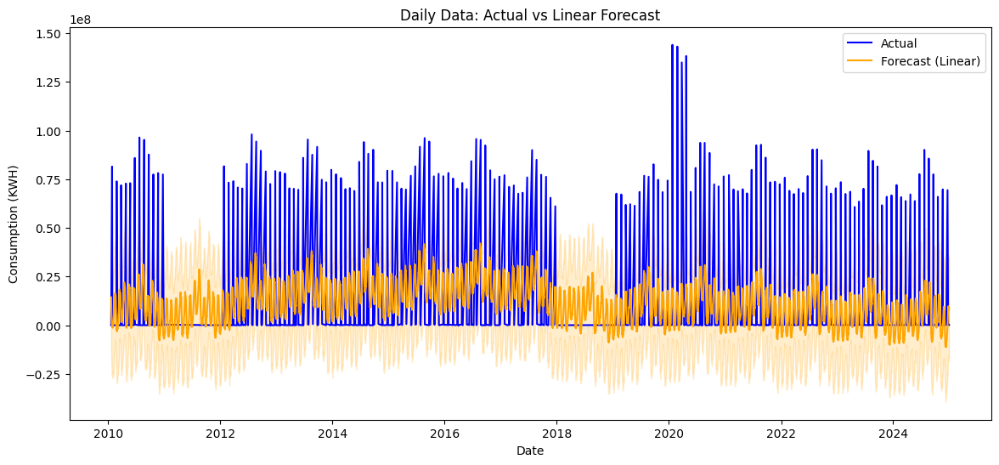

In [38]:
plt.figure(figsize=(14,6))
plt.plot(daily_data_full['ds'], daily_data_full['y'], label='Actual', color='blue')
plt.plot(forecast_linear['ds'][:len(daily_data_full)], forecast_linear['yhat'][:len(daily_data_full)], label='Forecast (Linear)', color='orange')
plt.fill_between(forecast_linear['ds'][:len(daily_data_full)],
                 forecast_linear['yhat_lower'][:len(daily_data_full)],
                 forecast_linear['yhat_upper'][:len(daily_data_full)],
                 color='orange', alpha=0.2)
plt.title('Daily Data: Actual vs Linear Forecast')
plt.xlabel('Date')
plt.ylabel('Consumption (KWH)')
plt.legend()
plt.show()

**TIME SERIES: MONTHLY DATASET**

In [39]:
monthly_data = daily_data_full.copy()
monthly_data = monthly_data.groupby(pd.Grouper(key='ds', freq='ME')).agg({'y': 'mean'}).reset_index()

**TIME UNIT DETECTION**

In [40]:
time_unit_monthly = detect_time_unit(monthly_data)
print(time_unit_monthly)

monthly


**PROPHET MODELING FORECASTING: DEFAULT MODEL FOR MONTHLY DATA**

In [41]:
model_monthly_default = Prophet()

model_monthly_default.fit(monthly_data)

future_monthly_default = model_monthly_default.make_future_dataframe(periods=9, freq='M')

forecast_monthly_default = model_monthly_default.predict(future_monthly_default)

forecast_monthly_default[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/phvu1w_5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/qxfwsyyr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20440', 'data', 'file=/tmp/tmpm_jcj0g8/phvu1w_5.json', 'init=/tmp/tmpm_jcj0g8/qxfwsyyr.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelhtna5h3e/prophet_model-20250506195042.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:50:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:50:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
179,2024-12-31,2.225859e+06,-1.081323e+07,1.655091e+07
180,2025-01-31,3.957634e+06,-9.935830e+06,1.822393e+07
181,2025-02-28,2.752138e+06,-1.242698e+07,1.699822e+07
182,2025-03-31,4.086916e+06,-8.772679e+06,1.840161e+07
183,2025-04-30,6.613385e+06,-7.800385e+06,2.157487e+07
184,2025-05-31,5.150974e+06,-8.500271e+06,1.983055e+07
185,2025-06-30,6.322445e+06,-8.475741e+06,2.052337e+07
186,2025-07-31,1.245847e+07,-1.826355e+06,2.547594e+07
187,2025-08-31,1.516256e+07,1.043404e+06,3.056116e+07
188,2025-09-30,5.847390e+06,-8.901268e+06,2.029969e+07


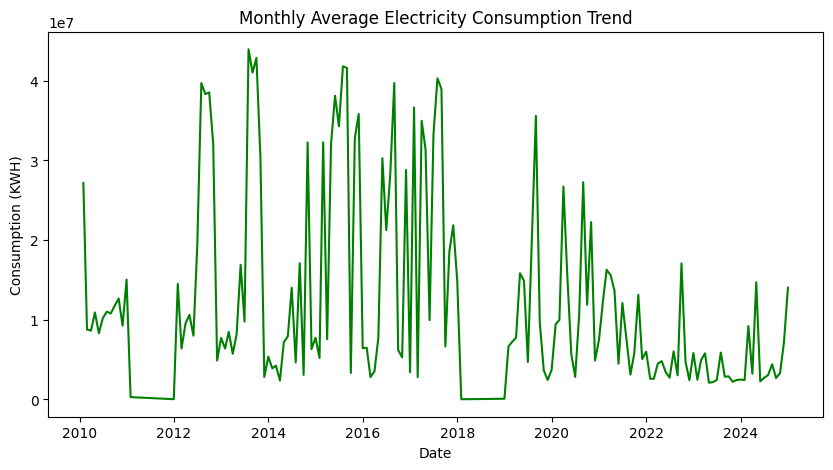

In [42]:
plt.figure(figsize=(10,5))
sns.lineplot(x='ds', y='y', data=monthly_data, color='green')
plt.title('Monthly Average Electricity Consumption Trend')
plt.xlabel('Date')
plt.ylabel('Consumption (KWH)')
plt.show()

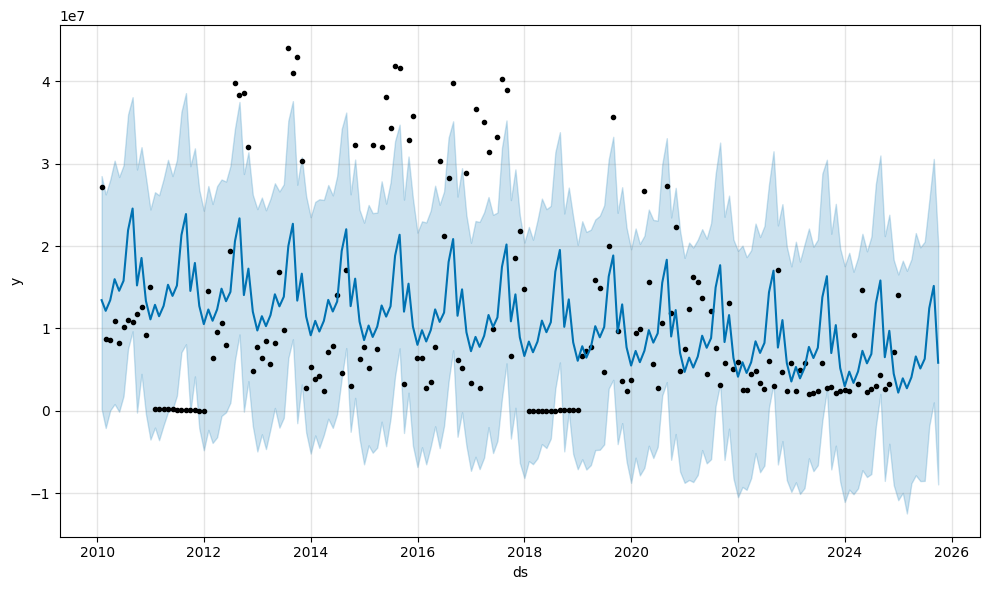

In [43]:
fig_default_monthly = model_monthly_default.plot(forecast_monthly_default)

**LINEAR GROWTH TUNED MODEL**

In [44]:
model_monthly_linear = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_monthly_linear.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_monthly_linear.fit(monthly_data)

future_monthly_linear = model_monthly_linear.make_future_dataframe(periods=9, freq='M')

forecast_monthly_linear = model_monthly_linear.predict(future_monthly_linear)

forecast_monthly_linear[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/ylsq7j_6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/3j674ft0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11215', 'data', 'file=/tmp/tmpm_jcj0g8/ylsq7j_6.json', 'init=/tmp/tmpm_jcj0g8/3j674ft0.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelgnt1pphe/prophet_model-20250506195047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:50:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:50:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
179,2024-12-31,-2.516877e+04,-1.294105e+07,1.325867e+07
180,2025-01-31,1.176483e+06,-1.241097e+07,1.566679e+07
181,2025-02-28,9.334255e+05,-1.209304e+07,1.511359e+07
182,2025-03-31,2.005822e+06,-1.103505e+07,1.497057e+07
183,2025-04-30,4.792627e+06,-7.667964e+06,1.875878e+07
184,2025-05-31,3.060260e+06,-1.029636e+07,1.728217e+07
185,2025-06-30,4.465687e+06,-1.005353e+07,1.846924e+07
186,2025-07-31,1.043765e+07,-2.989007e+06,2.444401e+07
187,2025-08-31,1.307109e+07,-9.848223e+05,2.619663e+07
188,2025-09-30,3.758268e+06,-9.657251e+06,1.793412e+07


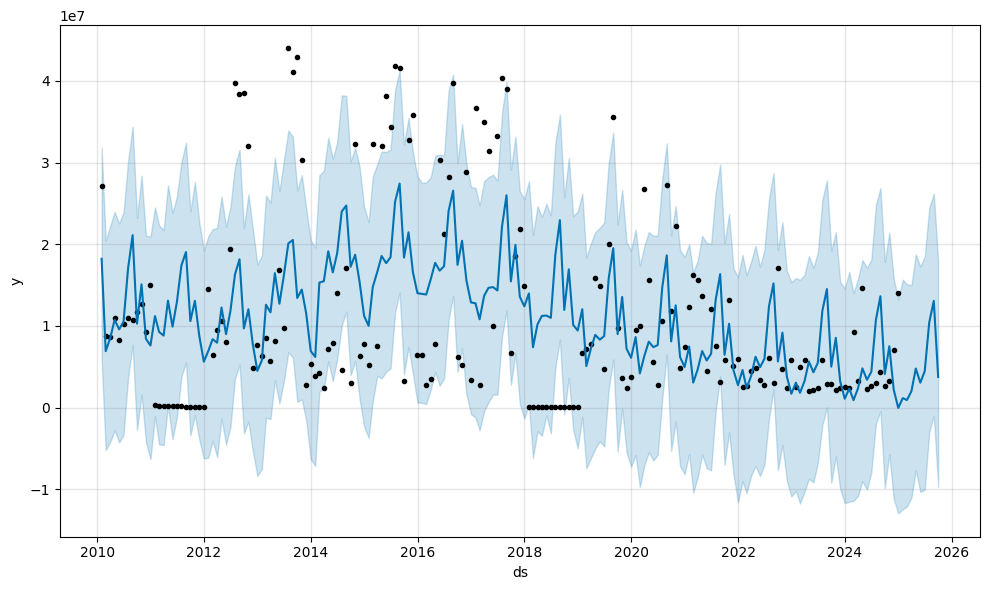

In [45]:
fig_linear_monthly = model_monthly_linear.plot(forecast_monthly_linear)

**LOGISTIC GROWTH TUNED MODEL**

In [46]:
monthly_data_logistic = monthly_data.copy()
monthly_data_logistic['cap'] = monthly_data_logistic['y'].max() * 1.2

model_monthly_logistic = Prophet(
    growth='logistic',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_monthly_logistic.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_monthly_logistic.fit(monthly_data_logistic)

future_monthly_logistic = model_monthly_logistic.make_future_dataframe(periods=9, freq='M')
future_monthly_logistic['cap'] = monthly_data_logistic['cap'].iloc[0]

forecast_monthly_logistic = model_monthly_logistic.predict(future_monthly_logistic)

forecast_monthly_logistic[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/g9_v2lgb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/1z3ac2a0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89530', 'data', 'file=/tmp/tmpm_jcj0g8/g9_v2lgb.json', 'init=/tmp/tmpm_jcj0g8/1z3ac2a0.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelbxzir36o/prophet_model-20250506195051.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:50:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:50:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
179,2024-12-31,-7.202057e+04,-1.327455e+07,1.241361e+07
180,2025-01-31,9.198851e+05,-1.253068e+07,1.415398e+07
181,2025-02-28,4.485887e+06,-7.978074e+06,1.728780e+07
182,2025-03-31,4.046932e+06,-9.751340e+06,1.755167e+07
183,2025-04-30,8.326704e+06,-6.538629e+06,2.230395e+07
184,2025-05-31,5.128750e+06,-8.812151e+06,1.824211e+07
185,2025-06-30,8.044560e+06,-5.386829e+06,2.114658e+07
186,2025-07-31,1.251319e+07,-1.315210e+06,2.617628e+07
187,2025-08-31,1.402253e+07,2.363620e+05,2.734138e+07
188,2025-09-30,5.896657e+06,-6.829966e+06,1.980545e+07


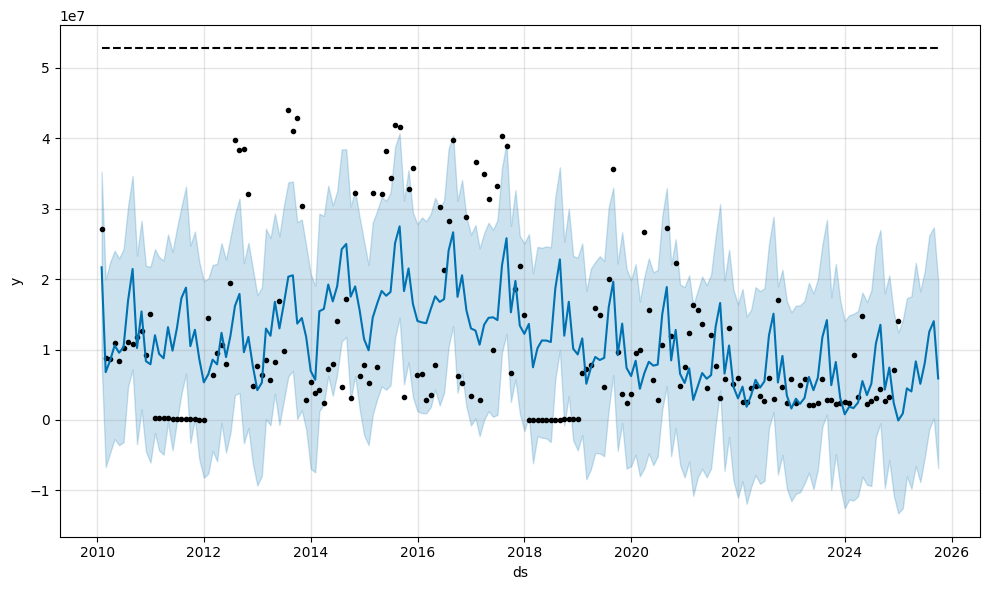

In [47]:
fig_logistic_monthly = model_monthly_logistic.plot(forecast_monthly_logistic)

**FLAT GROWTH TUNED MODEL**

In [48]:
monthly_data_flat = monthly_data.copy()
monthly_data_flat['y'] = monthly_data_flat['y'].mean()

model_monthly_flat = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_monthly_flat.add_seasonality(
    name='monthly',
    period=30.5,
    fourier_order=5
)

model_monthly_flat.fit(monthly_data_flat)

future_monthly_flat = model_monthly_flat.make_future_dataframe(periods=9, freq='M')

forecast_monthly_flat = model_monthly_flat.predict(future_monthly_flat)

forecast_monthly_flat[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
179,2024-12-31,1.146767e+07,1.146767e+07,1.146767e+07
180,2025-01-31,1.146767e+07,1.146767e+07,1.146767e+07
181,2025-02-28,1.146767e+07,1.146767e+07,1.146767e+07
182,2025-03-31,1.146767e+07,1.146767e+07,1.146767e+07
183,2025-04-30,1.146767e+07,1.146767e+07,1.146767e+07
184,2025-05-31,1.146767e+07,1.146767e+07,1.146767e+07
185,2025-06-30,1.146767e+07,1.146767e+07,1.146767e+07
186,2025-07-31,1.146767e+07,1.146767e+07,1.146767e+07
187,2025-08-31,1.146767e+07,1.146767e+07,1.146767e+07
188,2025-09-30,1.146767e+07,1.146767e+07,1.146767e+07


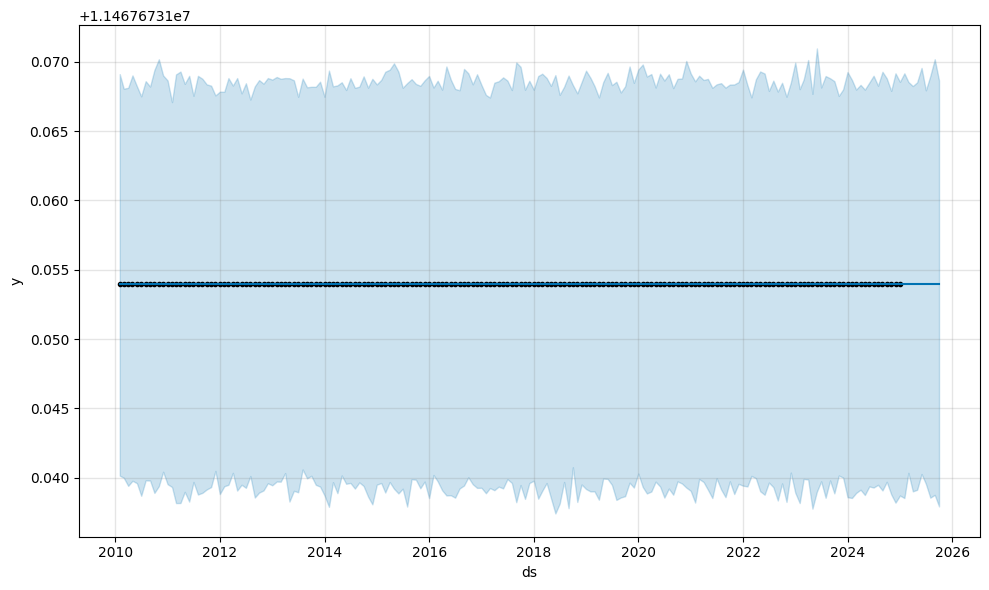

In [49]:
fig_flat_monthly = model_monthly_flat.plot(forecast_monthly_flat)

**EVALUATION METRICS: MAE, MAPE & R²**

In [50]:
y_actual_monthly = monthly_data['y']
y_pred_default = forecast_monthly_default['yhat'][:len(monthly_data)]

mae_def, mape_def, r2_def = evaluate_model(y_actual_monthly, y_pred_default)
print("Default Model -> MAE:", mae_def, "MAPE:", mape_def, "R²:", r2_def)

Default Model -> MAE: 8.73537749420964 MAPE: 2542.39337704435 R²: 0.14856761604871516


In [51]:
y_pred_linear = forecast_monthly_linear['yhat'][:len(monthly_data)]

mae_lin, mape_lin, r2_lin = evaluate_model(y_actual_monthly, y_pred_linear)
print("Linear Model -> MAE:", mae_lin, "MAPE:", mape_lin, "R²:", r2_lin)

Linear Model -> MAE: 8.313076572343855 MAPE: 2568.045921531639 R²: 0.23527453824970634


In [52]:
y_pred_logistic = forecast_monthly_logistic['yhat'][:len(monthly_data)]

mae_log, mape_log, r2_log = evaluate_model(y_actual_monthly, y_pred_logistic)
print("Logistic Model -> MAE:", mae_log, "MAPE:", mape_log, "R²:", r2_log)

Logistic Model -> MAE: 8.310730320105375 MAPE: 2551.690169018203 R²: 0.2353808291341395


In [53]:
y_pred_flat = forecast_monthly_flat['yhat'][:len(monthly_data)]

mae_flat, mape_flat, r2_flat = evaluate_model(y_actual_monthly, y_pred_flat)
print("Flat Model -> MAE:", mae_flat, "MAPE:", mape_flat, "R²:", r2_flat)

Flat Model -> MAE: 9.436799111209261 MAPE: 2558.2939994875583 R²: 0.0


In [54]:
# Forecast values at 1, 6, and 9 months ahead
monthly_forecast_needed = forecast_monthly_linear.iloc[[1-1, 6-1, 9-1]][['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
print("Monthly Forecast for 1, 6, 9 Months Ahead:")
print(monthly_forecast_needed)

Monthly Forecast for 1, 6, 9 Months Ahead:
          ds          yhat    yhat_lower    yhat_upper
0 2010-01-31  1.821942e+07  5.928930e+06  3.184622e+07
5 2010-06-30  1.051732e+07 -3.320652e+06  2.391731e+07
8 2010-09-30  1.027502e+07 -2.736020e+06  2.322722e+07


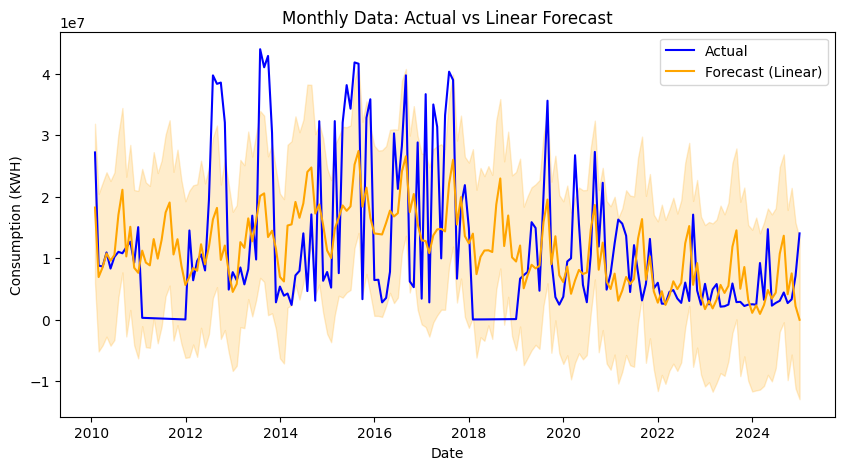

In [55]:
plt.figure(figsize=(10,5))
plt.plot(monthly_data['ds'], monthly_data['y'], label='Actual', color='blue')
plt.plot(forecast_monthly_linear['ds'][:len(monthly_data)], forecast_monthly_linear['yhat'][:len(monthly_data)], label='Forecast (Linear)', color='orange')
plt.fill_between(forecast_monthly_linear['ds'][:len(monthly_data)],
                 forecast_monthly_linear['yhat_lower'][:len(monthly_data)],
                 forecast_monthly_linear['yhat_upper'][:len(monthly_data)],
                 color='orange', alpha=0.2)
plt.title('Monthly Data: Actual vs Linear Forecast')
plt.xlabel('Date')
plt.ylabel('Consumption (KWH)')
plt.legend()
plt.show()

**TIME SERIES: YEARLY DATASET**

In [56]:
yearly_data = daily_data_full.copy()
yearly_data = yearly_data.groupby(pd.Grouper(key='ds', freq='YE')).agg({'y': 'mean'}).reset_index()

**TIME UNIT DETECTION**

In [57]:
time_unit_yearly = detect_time_unit(yearly_data)
print(time_unit_yearly)

daily


In [58]:
yearly_data.head()

,ds,y
0,2010-12-31,1.125789e+07
1,2011-12-31,1.595234e+05
2,2012-12-31,1.922191e+07
3,2013-12-31,1.859842e+07
4,2014-12-31,9.290377e+06


**PROPHET MODELING FORECASTING: DEFAULT MODEL FOR YEARLY DATA**

In [59]:
model_yearly_default = Prophet()

model_yearly_default.fit(yearly_data)

future_yearly_default = model_yearly_default.make_future_dataframe(periods=20, freq='Y')

forecast_yearly_default = model_yearly_default.predict(future_yearly_default)

forecast_yearly_default[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/__lnaiux.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/5e8zjar_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47192', 'data', 'file=/tmp/tmpm_jcj0g8/__lnaiux.json', 'init=/tmp/tmpm_jcj0g8/5e8zjar_.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelsgcecpue/prophet_model-20250506195114.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
19:51:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:51:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:

,ds,yhat,yhat_lower,yhat_upper
25,2035-12-31,-3.317336e+06,-1.209928e+07,5.158656e+06
26,2036-12-31,2.674095e+06,-6.195402e+06,1.182574e+07
27,2037-12-31,-1.860920e+05,-9.473236e+06,8.658452e+06
28,2038-12-31,-3.038476e+06,-1.196723e+07,6.021350e+06
29,2039-12-31,-5.880351e+06,-1.517197e+07,2.266926e+06
30,2040-12-31,1.110788e+05,-8.945909e+06,9.069432e+06
31,2041-12-31,-2.749108e+06,-1.149230e+07,6.984953e+06
32,2042-12-31,-5.601492e+06,-1.447120e+07,3.010882e+06
33,2043-12-31,-8.443367e+06,-1.762484e+07,8.743356e+05
34,2044-12-31,-2.451937e+06,-1.121256e+07,7.457213e+06


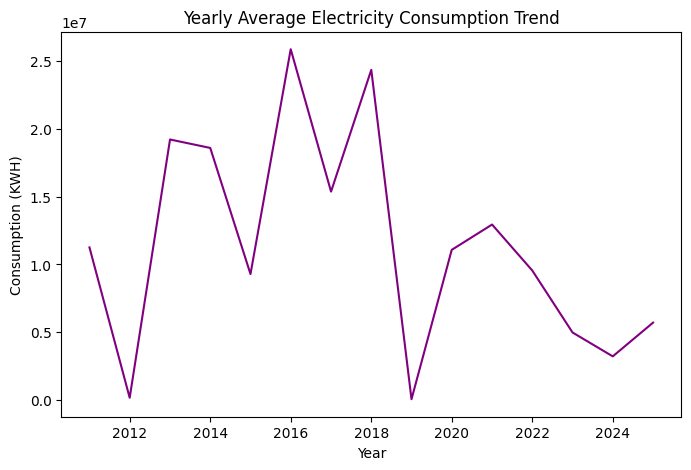

In [60]:
plt.figure(figsize=(8,5))
sns.lineplot(x='ds', y='y', data=yearly_data, color='purple')
plt.title('Yearly Average Electricity Consumption Trend')
plt.xlabel('Year')
plt.ylabel('Consumption (KWH)')
plt.show()

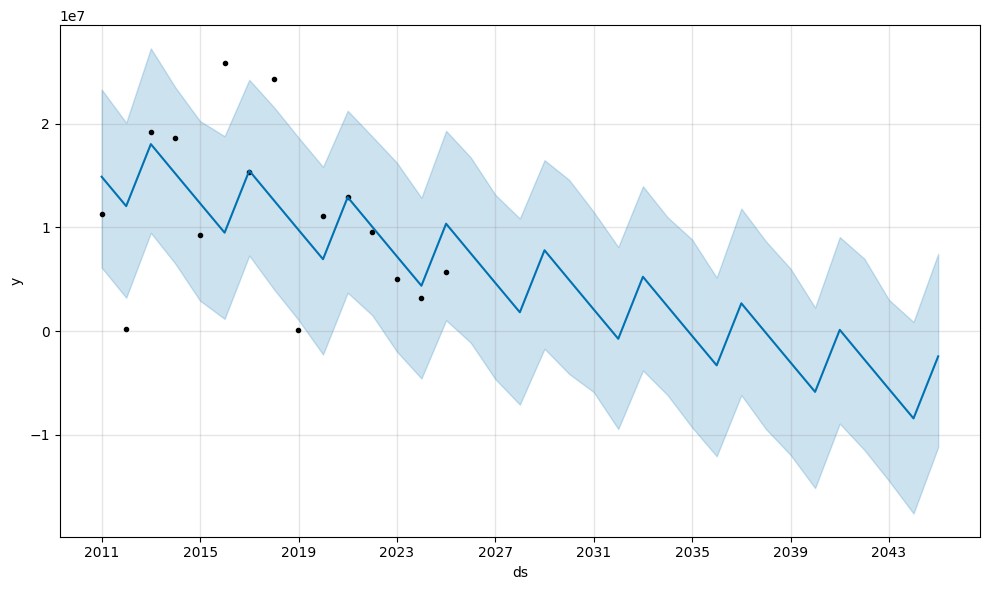

In [61]:
fig_yearly_default = model_yearly_default.plot(forecast_yearly_default)

**LINEAR GROWTH TUNED MODEL**

In [62]:
model_yearly_linear = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_yearly_linear.add_seasonality(
    name='yearly_custom',
    period=365.25,
    fourier_order=5
)

model_yearly_linear.fit(yearly_data)

future_yearly_linear = model_yearly_linear.make_future_dataframe(periods=20, freq='Y')

forecast_yearly_linear = model_yearly_linear.predict(future_yearly_linear)

forecast_yearly_linear[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/29298946.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/036l9bxg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95625', 'data', 'file=/tmp/tmpm_jcj0g8/29298946.json', 'init=/tmp/tmpm_jcj0g8/036l9bxg.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_model52s0sflt/prophet_model-20250506195121.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
19:51:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:51:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
25,2035-12-31,-3.330013e+06,-1.215108e+07,6.121454e+06
26,2036-12-31,2.677405e+06,-6.213255e+06,1.116568e+07
27,2037-12-31,-1.954387e+05,-8.563091e+06,9.194611e+06
28,2038-12-31,-3.053867e+06,-1.168419e+07,5.999220e+06
29,2039-12-31,-5.895410e+06,-1.492855e+07,3.188705e+06
30,2040-12-31,1.120081e+05,-8.401452e+06,9.327281e+06
31,2041-12-31,-2.760835e+06,-1.136338e+07,5.975441e+06
32,2042-12-31,-5.619264e+06,-1.484553e+07,3.502366e+06
33,2043-12-31,-8.460807e+06,-1.738039e+07,6.254017e+05
34,2044-12-31,-2.453389e+06,-1.108102e+07,6.812514e+06


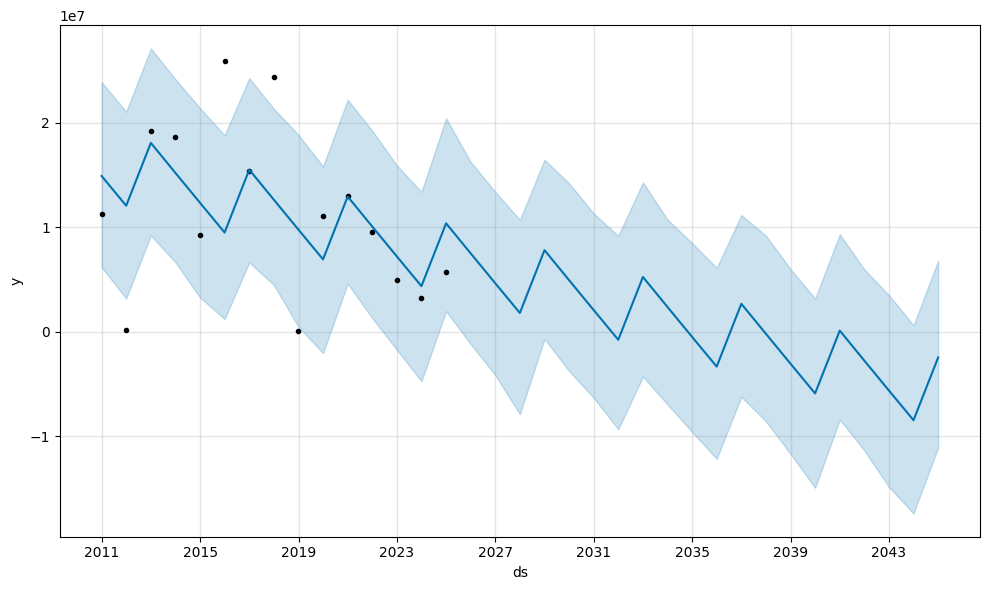

In [63]:
fig_yearly_linear = model_yearly_linear.plot(forecast_yearly_linear)

**LOGISTIC GROWTH TUNED MODEL**

In [64]:
yearly_data_logistic = yearly_data.copy()
yearly_data_logistic['cap'] = yearly_data_logistic['y'].max() * 1.2

model_yearly_logistic = Prophet(
    growth='logistic',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_yearly_logistic.add_seasonality(
    name='yearly_custom',
    period=365.25,
    fourier_order=5
)

model_yearly_logistic.fit(yearly_data_logistic)

future_yearly_logistic = model_yearly_logistic.make_future_dataframe(periods=20, freq='Y')
future_yearly_logistic['cap'] = yearly_data_logistic['cap'].iloc[0]

forecast_yearly_logistic = model_yearly_logistic.predict(future_yearly_logistic)

forecast_yearly_logistic[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

INFO:prophet:n_changepoints greater than number of observations. Using 11.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/s6jdv2oj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_jcj0g8/iocku00f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79480', 'data', 'file=/tmp/tmpm_jcj0g8/s6jdv2oj.json', 'init=/tmp/tmpm_jcj0g8/iocku00f.json', 'output', 'file=/tmp/tmpm_jcj0g8/prophet_modelkmg690pg/prophet_model-20250506195126.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
19:51:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:51:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
30,2040-12-31,-1.160986e+07,-2.031085e+07,-3.228681e+06
31,2041-12-31,-1.405110e+07,-2.202810e+07,-5.463595e+06
32,2042-12-31,-1.640989e+07,-2.471463e+07,-8.558365e+06
33,2043-12-31,-1.869139e+07,-2.660102e+07,-1.011595e+07
34,2044-12-31,-1.201007e+07,-2.056950e+07,-3.609197e+06


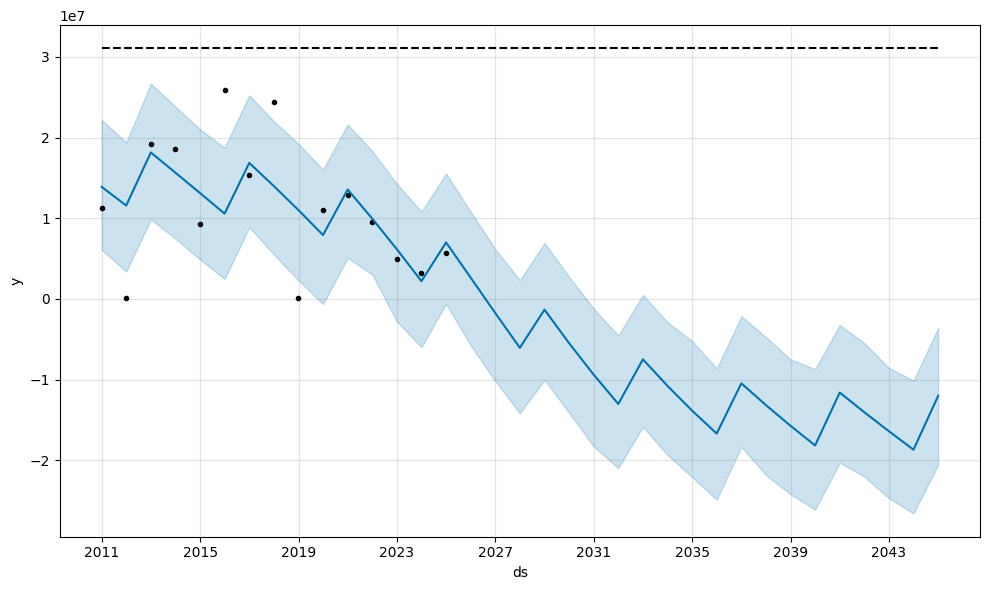

In [65]:
fig_yearly_logistic = model_yearly_logistic.plot(forecast_yearly_logistic)

**FLAT GROWTH TUNED MODEL**

In [66]:
yearly_data_flat = yearly_data.copy()
yearly_data_flat['y'] = yearly_data_flat['y'].mean()

model_yearly_flat = Prophet(
    growth='linear',
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1
)

model_yearly_flat.add_seasonality(
    name='yearly_custom',
    period=365.25,
    fourier_order=5
)

model_yearly_flat.fit(yearly_data_flat)

future_yearly_flat = model_yearly_flat.make_future_dataframe(periods=20, freq='Y')

forecast_yearly_flat = model_yearly_flat.predict(future_yearly_flat)

forecast_yearly_flat[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

INFO:prophet:n_changepoints greater than number of observations. Using 11.


,ds,yhat,yhat_lower,yhat_upper
25,2035-12-31,1.144538e+07,1.144538e+07,1.144538e+07
26,2036-12-31,1.144538e+07,1.144538e+07,1.144538e+07
27,2037-12-31,1.144538e+07,1.144538e+07,1.144538e+07
28,2038-12-31,1.144538e+07,1.144538e+07,1.144538e+07
29,2039-12-31,1.144538e+07,1.144538e+07,1.144538e+07
30,2040-12-31,1.144538e+07,1.144538e+07,1.144538e+07
31,2041-12-31,1.144538e+07,1.144538e+07,1.144538e+07
32,2042-12-31,1.144538e+07,1.144538e+07,1.144538e+07
33,2043-12-31,1.144538e+07,1.144538e+07,1.144538e+07
34,2044-12-31,1.144538e+07,1.144538e+07,1.144538e+07


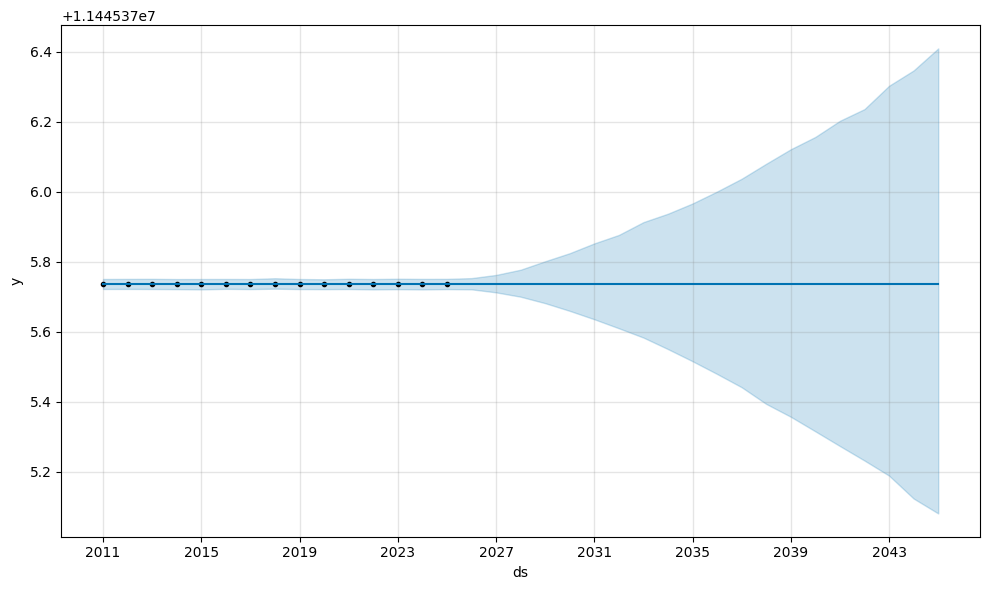

In [67]:
fig_yearly_flat = model_yearly_flat.plot(forecast_yearly_flat)

**EVALUATION METRICS: MAE, MAPE & R²**

In [68]:
y_actual_yearly = yearly_data['y']
y_pred_default = forecast_yearly_default['yhat'][:len(yearly_data)]

mae_def, mape_def, r2_def = evaluate_model(y_actual_yearly, y_pred_default)
print("Default Model -> MAE:", mae_def, "MAPE:", mape_def, "R²:", r2_def)

Default Model -> MAE: 4.9233746710829696 MAPE: 1738.6567850773374 R²: 0.20742476019453326


In [69]:
y_pred_linear = forecast_yearly_linear['yhat'][:len(yearly_data)]

mae_lin, mape_lin, r2_lin = evaluate_model(y_actual_yearly, y_pred_linear)
print("Linear Model -> MAE:", mae_lin, "MAPE:", mape_lin, "R²:", r2_lin)

Linear Model -> MAE: 4.921957014696669 MAPE: 1738.2752011755151 R²: 0.2074773274543451


In [70]:
y_pred_logistic = forecast_yearly_logistic['yhat'][:len(yearly_data)]

mae_log, mape_log, r2_log = evaluate_model(y_actual_yearly, y_pred_logistic)
print("Logistic Model -> MAE:", mae_log, "MAPE:", mape_log, "R²:", r2_log)

Logistic Model -> MAE: 4.513439641717114 MAPE: 1867.2411635294773 R²: 0.29784238796433404


In [71]:
y_pred_flat = forecast_yearly_flat['yhat'][:len(yearly_data)]

mae_flat, mape_flat, r2_flat = evaluate_model(y_actual_yearly, y_pred_flat)
print("Flat Model -> MAE:", mae_flat, "MAPE:", mape_flat, "R²:", r2_flat)

Flat Model -> MAE: 6.362199708412823 MAPE: 1944.789986353995 R²: 0.0


In [72]:
# Forecast values at 1, 10, and 20 years ahead
yearly_forecast_needed = forecast_yearly_linear.iloc[[1-1, 10-1, 20-1]][['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
print("Yearly Forecast for 1, 10, 20 Years Ahead:")
print(yearly_forecast_needed)

Yearly Forecast for 1, 10, 20 Years Ahead:
           ds          yhat    yhat_lower    yhat_upper
0  2010-12-31  1.490391e+07  6.165236e+06  2.388352e+07
9  2019-12-31  6.931574e+06 -2.039969e+06  1.581181e+07
19 2029-12-31  4.935355e+06 -3.759900e+06  1.420104e+07


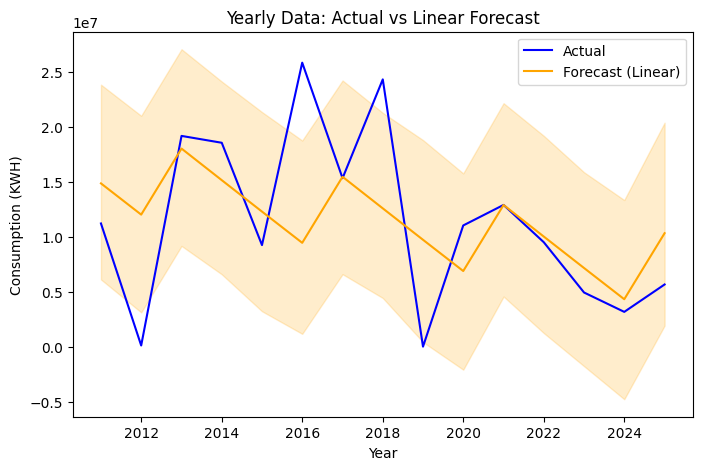

In [73]:
plt.figure(figsize=(8,5))
plt.plot(yearly_data['ds'], yearly_data['y'], label='Actual', color='blue')
plt.plot(forecast_yearly_linear['ds'][:len(yearly_data)], forecast_yearly_linear['yhat'][:len(yearly_data)], label='Forecast (Linear)', color='orange')
plt.fill_between(forecast_yearly_linear['ds'][:len(yearly_data)],
                 forecast_yearly_linear['yhat_lower'][:len(yearly_data)],
                 forecast_yearly_linear['yhat_upper'][:len(yearly_data)],
                 color='orange', alpha=0.2)
plt.title('Yearly Data: Actual vs Linear Forecast')
plt.xlabel('Year')
plt.ylabel('Consumption (KWH)')
plt.legend()
plt.show()

**SUMMARY EVALUATION METRICS**

In [74]:
# DAILY
mae_d_default, mape_d_default, r2_d_default = evaluate_model(daily_data_full['y'], forecast_default['yhat'][:len(daily_data_full)])
mae_d_linear, mape_d_linear, r2_d_linear = evaluate_model(daily_data_full['y'], forecast_linear['yhat'][:len(daily_data_full)])
mae_d_logistic, mape_d_logistic, r2_d_logistic = evaluate_model(daily_data_full['y'], forecast_logistic['yhat'][:len(daily_data_full)])
mae_d_flat, mape_d_flat, r2_d_flat = evaluate_model(daily_data_full['y'], forecast_flat['yhat'][:len(daily_data_full)])

# MONTHLY
mae_m_default, mape_m_default, r2_m_default = evaluate_model(monthly_data['y'], forecast_monthly_default['yhat'][:len(monthly_data)])
mae_m_linear, mape_m_linear, r2_m_linear = evaluate_model(monthly_data['y'], forecast_monthly_linear['yhat'][:len(monthly_data)])
mae_m_logistic, mape_m_logistic, r2_m_logistic = evaluate_model(monthly_data['y'], forecast_monthly_logistic['yhat'][:len(monthly_data)])
mae_m_flat, mape_m_flat, r2_m_flat = evaluate_model(monthly_data['y'], forecast_monthly_flat['yhat'][:len(monthly_data)])

# YEARLY
mae_y_default, mape_y_default, r2_y_default = evaluate_model(yearly_data['y'], forecast_yearly_default['yhat'][:len(yearly_data)])
mae_y_linear, mape_y_linear, r2_y_linear = evaluate_model(yearly_data['y'], forecast_yearly_linear['yhat'][:len(yearly_data)])
mae_y_logistic, mape_y_logistic, r2_y_logistic = evaluate_model(yearly_data['y'], forecast_yearly_logistic['yhat'][:len(yearly_data)])
mae_y_flat, mape_y_flat, r2_y_flat = evaluate_model(yearly_data['y'], forecast_yearly_flat['yhat'][:len(yearly_data)])

In [75]:
summary = pd.DataFrame({
    'Model': ['Default Prophet', 'Linear Growth', 'Logistic Growth', 'Flat Model'],

    'Daily MAE': [mae_d_default, mae_d_linear, mae_d_logistic, mae_d_flat],
    'Daily MAPE (%)': [mape_d_default, mape_d_linear, mape_d_logistic, mape_d_flat],
    'Daily R²': [r2_d_default, r2_d_linear, r2_d_logistic, r2_d_flat],

    'Monthly MAE': [mae_m_default, mae_m_linear, mae_m_logistic, mae_m_flat],
    'Monthly MAPE (%)': [mape_m_default, mape_m_linear, mape_m_logistic, mape_m_flat],
    'Monthly R²': [r2_m_default, r2_m_linear, r2_m_logistic, r2_m_flat],

    'Yearly MAE': [mae_y_default, mae_y_linear, mae_y_logistic, mae_y_flat],
    'Yearly MAPE (%)': [mape_y_default, mape_y_linear, mape_y_logistic, mape_y_flat],
    'Yearly R²': [r2_y_default, r2_y_linear, r2_y_logistic, r2_y_flat]
})

summary.set_index('Model', inplace=True)
summary.round(2)


,Daily MAE,Daily MAPE (%),Daily R²,Monthly MAE,Monthly MAPE (%),Monthly R²,Yearly MAE,Yearly MAPE (%),Yearly R²
Model,,,,,,,,,
Default Prophet,15.42,36366.72,0.09,8.74,2542.39,0.15,4.92,1738.66,0.21
Linear Growth,14.63,35947.85,0.22,8.31,2568.05,0.24,4.92,1738.28,0.21
Logistic Growth,15.13,35616.43,0.18,8.31,2551.69,0.24,4.51,1867.24,0.30
Flat Model,17.04,41849.05,0.00,9.44,2558.29,0.00,6.36,1944.79,0.00


**INSIGHTS**

**High Variability in Daily Consumption**
Daily total electricity consumption across New York City shows significant fluctuation.
Consumption patterns likely depend on factors like weather (hot summers, cold winters), business days vs weekends, and holidays.

**City-Wide Consumption Magnitude**
Total daily electricity consumption across all boroughs typically ranges from tens of millions to over a hundred million kilowatt-hours (KWH).
This confirms the dataset represents aggregated energy usage for a large, dense urban population.

**Smoothed Trends in Monthly and Yearly Data**
Aggregating daily data into monthly and yearly averages reveals clearer seasonal patterns.
Peaks often correspond to summer (air conditioning usage) and winter (heating) demands.
Troughs occur during spring and fall, when climate control usage is lower.

**High Error Metrics Explained by Scale**
MAE values are large (millions) simply because the scale of daily energy consumption is large.
MAPE is unusually high because small consumption values (in some months or years) exaggerate percentage errors — especially during low-consumption periods.

**Forecasting Behavior**
The Prophet models can capture overall trends and seasonalities reasonably well.
However, due to inherent daily noise (weather, operational changes, events), the models struggle to perfectly predict day-to-day fluctuations — which is normal.
Logistic and Linear growth models performed slightly better than Flat or Default models, especially at longer time horizons (yearly forecasts).